<a href="https://colab.research.google.com/github/mspsullivan/poisonml/blob/main/data_poisoning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Top threats part 2: Data Poisoning
## cloned from ART - Adversarial Patch - TensorFlow v2
## Initialization 1: Import Python packages

In [ ]:
!pip install git+https://github.com/nottombrown/imagenet_stubs
!pip install adversarial-robustness-toolbox
!pip install tensorflow_addons

import warnings
warnings.filterwarnings('ignore')

import random
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [10, 10]
import imagenet_stubs
from imagenet_stubs.imagenet_2012_labels import name_to_label

import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

from art.estimators.classification import TensorFlowV2Classifier, EnsembleClassifier
from art.attacks.evasion import AdversarialPatch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/nottombrown/imagenet_stubs to /tmp/pip-req-build-dtb7u_hw
  Running command git clone --filter=blob:none --quiet https://github.com/nottombrown/imagenet_stubs /tmp/pip-req-build-dtb7u_hw
  Resolved https://github.com/nottombrown/imagenet_stubs to commit 0b501276f54cbf45b8e1b67dccbdcbe51de88365
  Preparing metadata (setup.py) ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Initialization 2: Configure model settings

In [ ]:
target_name = 'toaster'
image_shape = (224, 224, 3)
clip_values = (0, 255)
nb_classes  =1000
batch_size = 16
scale_min = 0.4
scale_max = 1.0
rotation_max = 22.5
learning_rate = 5000.
max_iter = 500

# Model Engineering 1: Load algorithm

In [ ]:
model = tf.keras.applications.resnet50.ResNet50(weights="imagenet")

mean_b = 103.939
mean_g = 116.779
mean_r = 123.680

tfc = TensorFlowV2Classifier(model=model, loss_object=None, train_step=None, nb_classes=nb_classes,
                             input_shape=image_shape, clip_values=clip_values, 
                             preprocessing=([mean_b, mean_g, mean_r], np.array([1.0, 1.0, 1.0])))

102967424/102967424 [==============================] - 3s 0us/step


# Data engineering 1: Load images from source data

In [ ]:
images_list = list()

for image_path in imagenet_stubs.get_image_paths():
    im = image.load_img(image_path, target_size=(224, 224))
    im = image.img_to_array(im)
    im = im[:, :, ::-1].astype(np.float32) # RGB to BGR
    im = np.expand_dims(im, axis=0)
    images_list.append(im)

images = np.vstack(images_list)

In [ ]:
def bgr_to_rgb(x):
    return x[:, :, ::-1]

# Attack 1: Generate adversarial patch 

In [ ]:
ap = AdversarialPatch(classifier=tfc, rotation_max=rotation_max, scale_min=scale_min, scale_max=scale_max,
                      learning_rate=learning_rate, max_iter=max_iter, batch_size=batch_size,
                      patch_shape=(224, 224, 3))

label = name_to_label(target_name)
y_one_hot = np.zeros(nb_classes)
y_one_hot[label] = 1.0
y_target = np.tile(y_one_hot, (images.shape[0], 1))

patch, patch_mask = ap.generate(x=images, y=y_target)

Adversarial Patch TensorFlow v2:   0%|          | 0/500 [00:00<?, ?it/s]

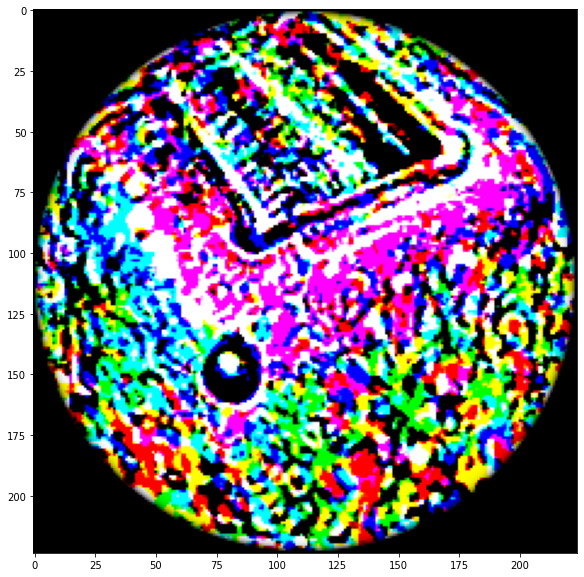

In [ ]:
plt.imshow((bgr_to_rgb(patch) * patch_mask).astype(np.uint8))

# Model Engineering 2: Apply algorithm

In [ ]:
patched_images = ap.apply_patch(images, scale=0.5)

In [ ]:
def predict_model(classifier, image):
    plt.imshow(bgr_to_rgb(image.astype(np.uint8)))
    plt.show()
    
    image = np.copy(image)
    image = np.expand_dims(image, axis=0)
    
    prediction = classifier.predict(image)
    
    top = 5
    prediction_decode = decode_predictions(prediction, top=top)[0]
    print('Predictions:')
    
    lengths = list()
    for i in range(top):
        lengths.append(len(prediction_decode[i][1]))
    max_length = max(lengths)
    
    for i in range(top):
        name = prediction_decode[i][1]
        name = name.ljust(max_length, " ")
        probability = prediction_decode[i][2]
        output_str = "{} {:.6f}".format(name, probability)
        print(output_str)

In [ ]:
predict_model(tfc, patched_images[0])

NameError: ignored

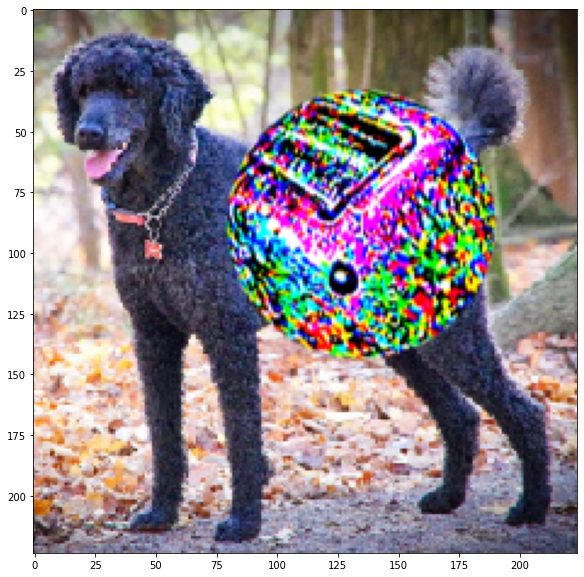

Predictions:
standard_poodle     0.99
miniature_poodle    0.01
toaster             0.00
toy_poodle          0.00
Irish_water_spaniel 0.00


In [ ]:
predict_model(tfc, patched_images[1])

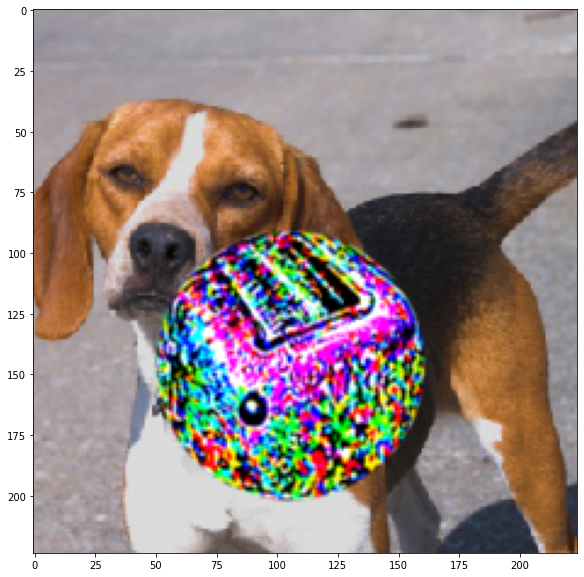

Predictions:
toaster          1.00
beagle           0.00
English_foxhound 0.00
Walker_hound     0.00
piggy_bank       0.00


In [ ]:
predict_model(tfc, patched_images[2])

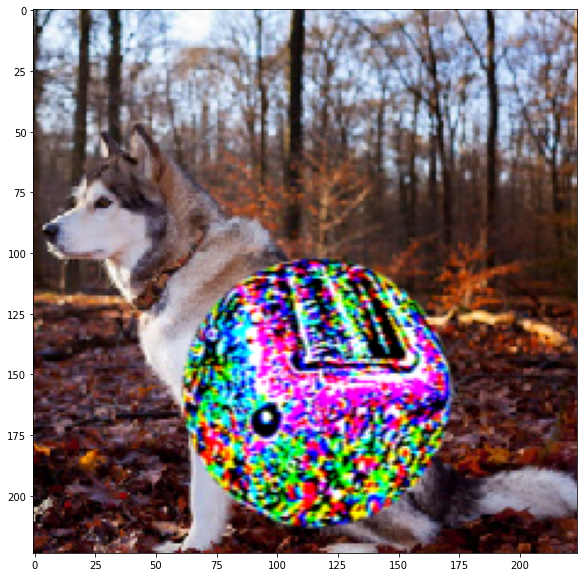

Predictions:
toaster        0.98
malamute       0.01
Siberian_husky 0.00
piggy_bank     0.00
Eskimo_dog     0.00


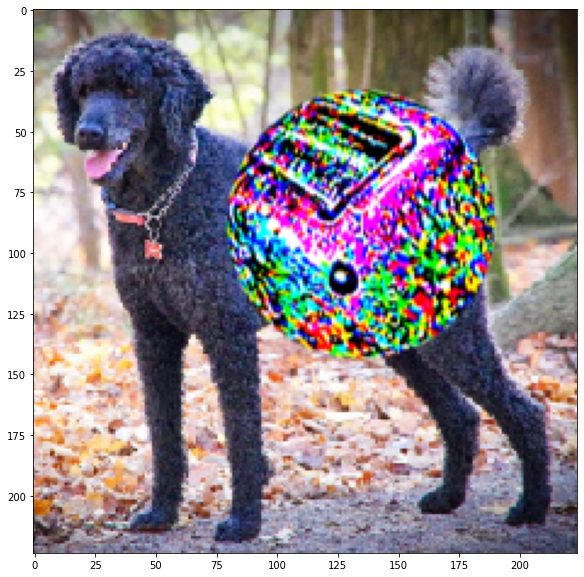

Predictions:
standard_poodle     0.99
miniature_poodle    0.01
toaster             0.00
toy_poodle          0.00
Irish_water_spaniel 0.00


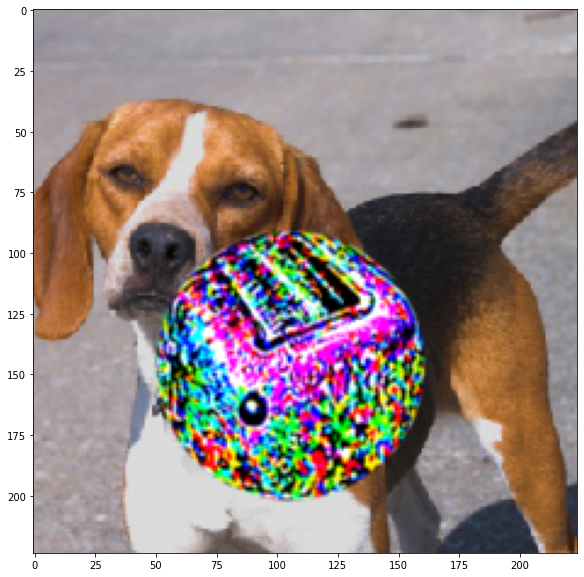

Predictions:
toaster          1.00
beagle           0.00
English_foxhound 0.00
Walker_hound     0.00
piggy_bank       0.00


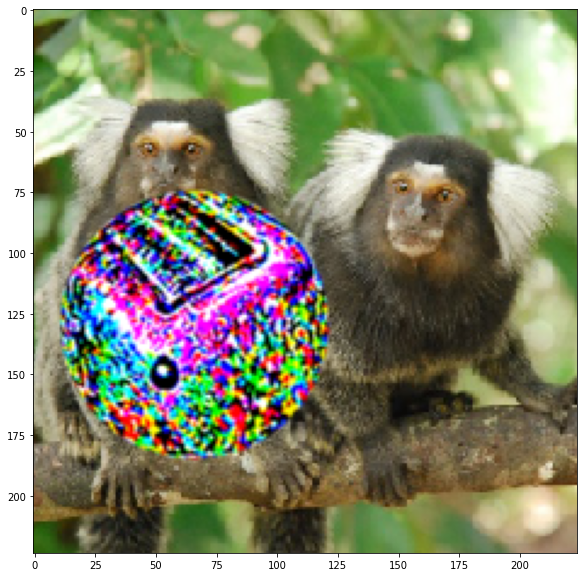

Predictions:
marmoset 0.58
titi     0.32
toaster  0.10
langur   0.00
capuchin 0.00


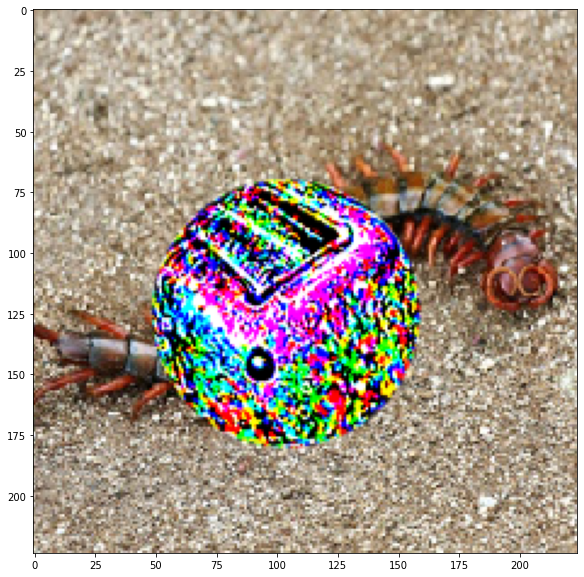

Predictions:
toaster          1.00
piggy_bank       0.00
purse            0.00
pencil_sharpener 0.00
maraca           0.00


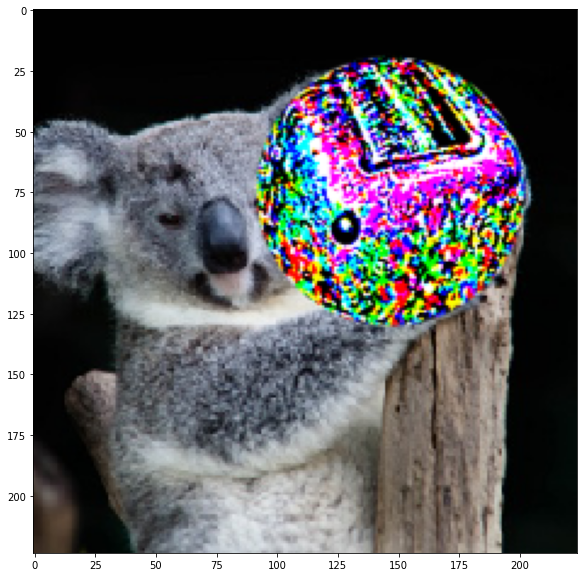

Predictions:
toaster       1.00
piggy_bank    0.00
koala         0.00
parking_meter 0.00
mouse         0.00


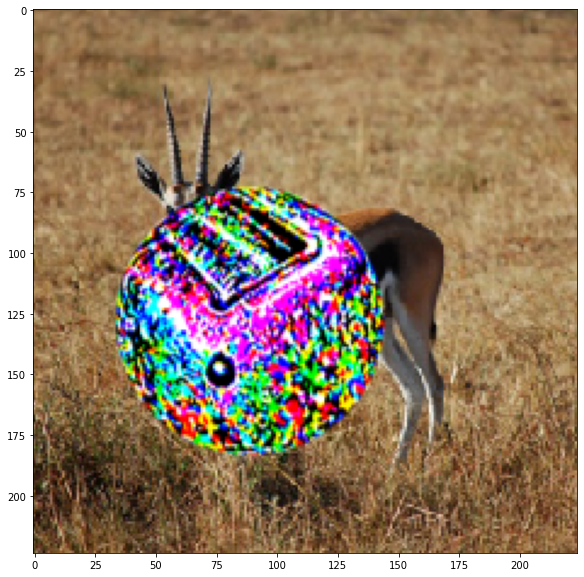

Predictions:
toaster    1.00
piggy_bank 0.00
mailbox    0.00
mailbag    0.00
purse      0.00


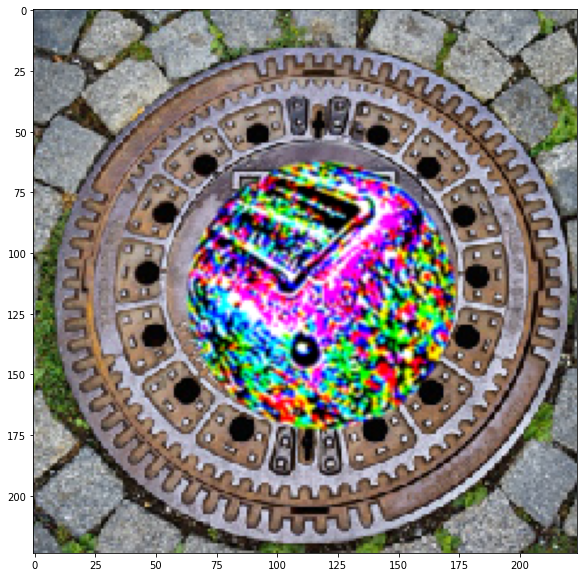

Predictions:
manhole_cover 1.00
car_wheel     0.00
tray          0.00
buckle        0.00
dome          0.00


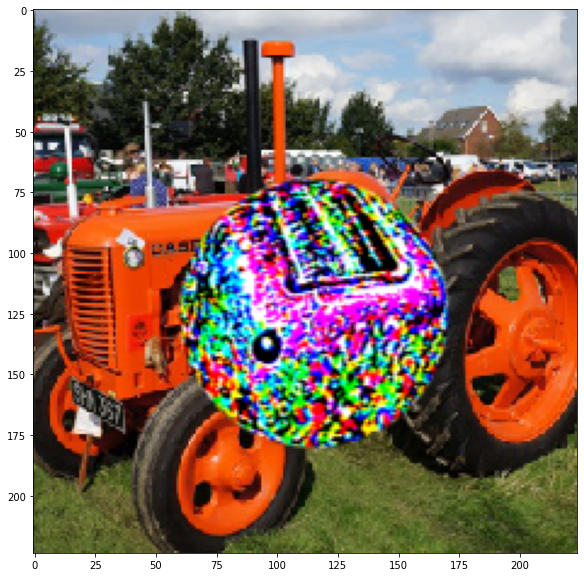

Predictions:
tractor    0.91
thresher   0.03
toaster    0.03
lawn_mower 0.02
tow_truck  0.00


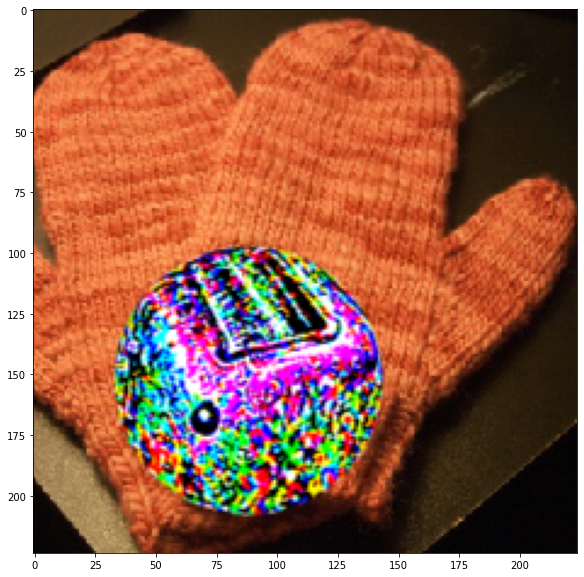

Predictions:
toaster    0.96
mitten     0.04
piggy_bank 0.00
mouse      0.00
sock       0.00


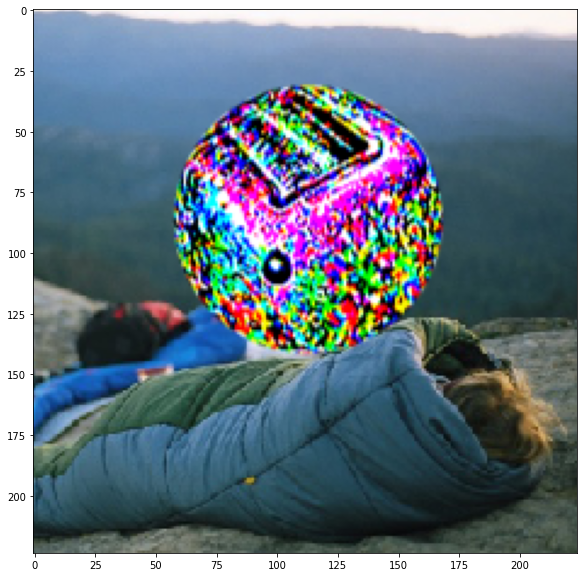

Predictions:
toaster    1.00
piggy_bank 0.00
backpack   0.00
binoculars 0.00
balloon    0.00


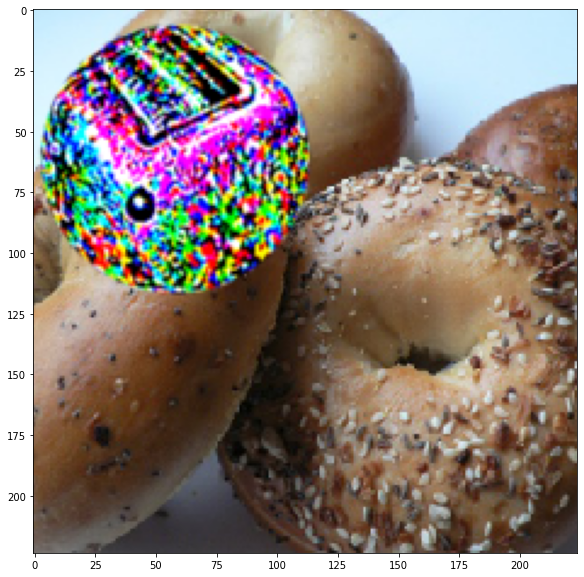

Predictions:
toaster    0.91
bagel      0.09
piggy_bank 0.00
bakery     0.00
pretzel    0.00


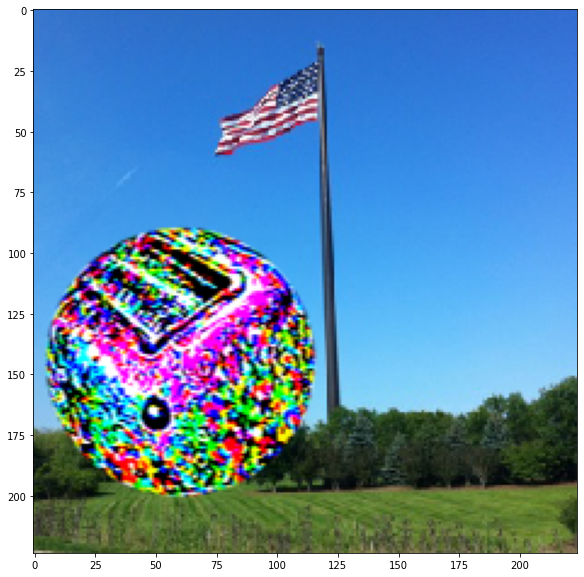

Predictions:
toaster       1.00
piggy_bank    0.00
mailbox       0.00
ashcan        0.00
parking_meter 0.00


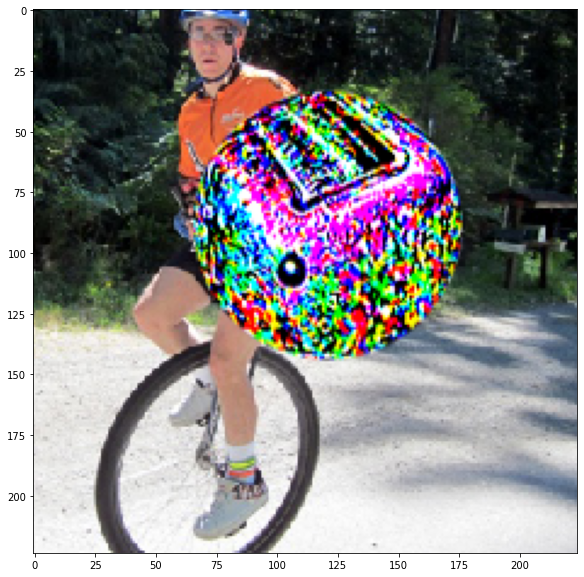

Predictions:
toaster       1.00
crash_helmet  0.00
unicycle      0.00
piggy_bank    0.00
mountain_bike 0.00


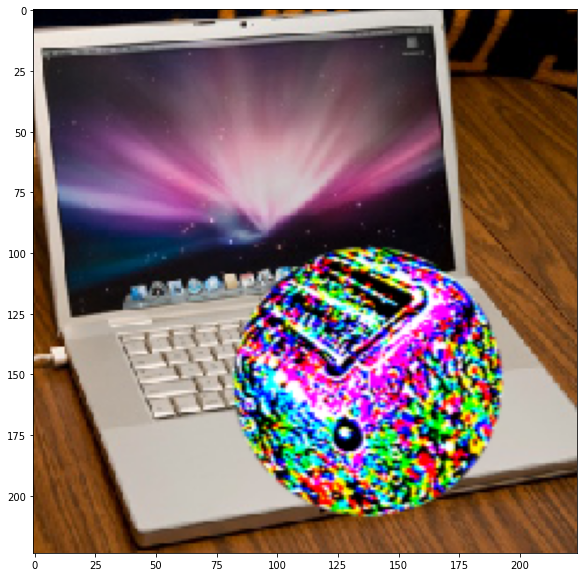

Predictions:
toaster    0.98
mouse      0.02
piggy_bank 0.00
notebook   0.00
printer    0.00


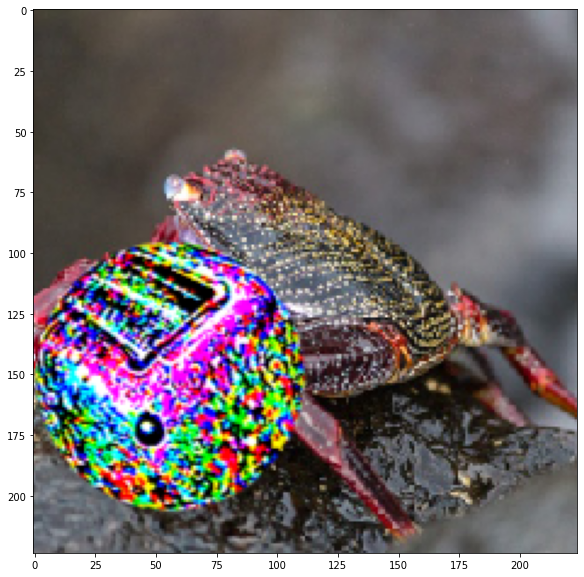

Predictions:
toaster     0.67
leaf_beetle 0.21
piggy_bank  0.06
purse       0.02
rock_crab   0.01


IndexError: ignored

In [ ]:
for i in range(224):
   predict_model(tfc, patched_images[i])

In [ ]:
print (patched_images[1])

NameError: ignored